# IPL AUCTION PRICE PREDICTION

The Indian Premier League (IPL) is a professional Twenty20 cricket league in India contested during April and May of every year by teams representing Indian cities and some states. The league was founded by the Board of Control for Cricket in India (BCCI) in 2008. The IPL is the most-attended cricket league in the world and in 2014 ranked sixth by average attendance among all sports leagues.IPL became the first sporting event in the world to be broadcast live on YouTube. The brand
value of IPL in 2018 was US$6.3 billion, according to Duff &amp; Phelps. According to BCCI, the 2015 IPL season contributed
₹11.5 billion to the GDP of the Indian economy.

Currently, with eight teams, each team plays each other twice in a home-and-away round-robin format in the league
phase. At the conclusion of the league stage, the top four teams will qualify for the playoffs. The top two teams from the
league phase will play against each other in the first Qualifying match, with the winner going straight to the IPL final and
the loser getting another chance to qualify for the IPL final by playing the second Qualifying match. Meanwhile, the third
and fourth place teams from league phase play against each other in an eliminator match and the winner from that match
will play the loser from the first Qualifying match. The winner of the second Qualifying match will move onto the final to
play the winner of the first Qualifying match in the IPL Final match, where the winner will be crowned the Indian Premier
League champions.

Data columns (total 30 columns):


Player             423 non-null object

Mat                423 non-null int64

Bat_Inns           423 non-null int64

Bat_NO             423 non-null int64

Bat_Runs           423 non-null int64

Bat_HS             423 non-null int64

Bat_Ave            423 non-null float64

Bat_BF             423 non-null int64

Bat_SR             423 non-null float64

Bat_100            423 non-null int64

Bat_50             423 non-null int64

Bat_0              423 non-null int64

Bat_4s             423 non-null int64

Bat_6s             423 non-null int64

Bowl_Inns          423 non-null int64

Bowl_Overs         423 non-null float64

Bowl_Mdns          423 non-null int64

Bowl_Runs          423 non-null int64

Bowl_Wkts          423 non-null int64

Bowl_Ave           423 non-null float64

Bowl_Econ          423 non-null float64

Bowl_SR            423 non-null float64

Bowl_4             423 non-null int64

Bowl_5             423 non-null int64

Ct                 423 non-null int64

St                 423 non-null int64

capped/uncapped    423 non-null int64

BasePrice          423 non-null int64

SellingPrice       423 non-null int64

Type               423 non-null object


# Lets Play Cricket - 
# IPL AUCTION PRICE PREDICTION Exploration Analysis

# Data Description

In [2]:
import statsmodels.formula.api as smf
import numpy as np
import pandas as pd 
import seaborn as sns
import plotly.offline as py
import plotly.graph_objs as go
import plotly.tools as tls
import matplotlib.pyplot as plt
import seaborn as sns
from plotly.offline import init_notebook_mode,iplot
init_notebook_mode(connected=False)
import plotly.figure_factory as ff
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.plotly as py
from plotly import tools
from plotly.offline import init_notebook_mode,iplot
init_notebook_mode(connected=False)
import plotly.figure_factory as ff
import plotly.graph_objs as go
import matplotlib.pyplot as mlt
import seaborn as sns
from scipy.stats import norm
mlt.style.use('fivethirtyeight')
from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import Markdown, display

In [3]:
df=pd.read_csv("Train_IPL.csv")

In [4]:
df.head()

,Player,Mat,Bat_Inns,Bat_NO,Bat_Runs,Bat_HS,Bat_Ave,Bat_BF,Bat_SR,Bat_100,...,Bowl_Econ,Bowl_SR,Bowl_4,Bowl_5,Ct,St,capped/uncapped,Type,BasePrice,SellingPrice
0,A Ashish Reddy,31,23,8,280,36,18.666667,193,135.035,0,...,9.175,14.45,0,0,9,0,0,Bat,2000000,2000000
1,A Chandila,12,2,2,4,4,0.000000,7,57.140,0,...,6.200,21.20,1,0,7,0,0,Bowl,2000000,2000000
2,A Chopra,7,6,0,53,24,8.833333,71,74.640,0,...,0.000,0.00,0,0,2,0,0,Bat,2000000,2000000
3,A Dananjaya,9,4,1,13,7,4.333333,15,86.660,0,...,9.640,33.60,0,0,3,0,0,Bowl,3000000,3000000
4,A Flintoff,3,3,1,62,24,31.000000,53,116.980,0,...,9.540,33.00,0,0,4,0,1,Bat,10000000,76100000


In [5]:
df.tail()

,Player,Mat,Bat_Inns,Bat_NO,Bat_Runs,Bat_HS,Bat_Ave,Bat_BF,Bat_SR,Bat_100,...,Bowl_Econ,Bowl_SR,Bowl_4,Bowl_5,Ct,St,capped/uncapped,Type,BasePrice,SellingPrice
433,Yashpal Singh,11,5,2,24,12,8.000000,21,191.665,0,...,12.215000,25.700000,0,0,3,0,0,Bowl,2000000,2000000
434,YK Pathan,174,154,44,3204,100,29.127273,2241,140.650,1,...,7.373333,24.366667,0,0,43,0,1,All Rounder,32000000,96000000
435,Younis Khan,1,1,0,3,3,3.000000,7,42.850,0,...,0.000000,0.000000,0,0,1,0,1,Bat,3000000,9000000
436,YV Takawale,16,10,2,192,45,24.000000,178,107.710,0,...,0.000000,0.000000,0,0,13,4,0,Wk,1000000,2000000
437,Z Khan,157,81,32,584,24,11.918367,524,110.615,0,...,7.865000,20.750000,2,0,40,0,1,Bowl,10000000,42000000


In [6]:
df.shape

(438, 30)

In [7]:
df.columns

Index(['Player', 'Mat', 'Bat_Inns', 'Bat_NO', 'Bat_Runs', 'Bat_HS', 'Bat_Ave',
       'Bat_BF', 'Bat_SR', 'Bat_100', 'Bat_50', 'Bat_0', 'Bat_4s', 'Bat_6s',
       'Bowl_Inns', 'Bowl_Overs', 'Bowl_Mdns', 'Bowl_Runs', 'Bowl_Wkts',
       'Bowl_Ave', 'Bowl_Econ', 'Bowl_SR', 'Bowl_4', 'Bowl_5', 'Ct', 'St',
       'capped/uncapped', 'Type', 'BasePrice', 'SellingPrice'],
      dtype='object')

In [8]:
df.isnull().sum()

Player             0
Mat                0
Bat_Inns           0
Bat_NO             0
Bat_Runs           0
Bat_HS             0
Bat_Ave            0
Bat_BF             0
Bat_SR             0
Bat_100            0
Bat_50             0
Bat_0              0
Bat_4s             0
Bat_6s             0
Bowl_Inns          0
Bowl_Overs         0
Bowl_Mdns          0
Bowl_Runs          0
Bowl_Wkts          0
Bowl_Ave           0
Bowl_Econ          0
Bowl_SR            0
Bowl_4             0
Bowl_5             0
Ct                 0
St                 0
capped/uncapped    0
Type               0
BasePrice          0
SellingPrice       0
dtype: int64

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 438 entries, 0 to 437
Data columns (total 30 columns):
Player             438 non-null object
Mat                438 non-null int64
Bat_Inns           438 non-null int64
Bat_NO             438 non-null int64
Bat_Runs           438 non-null int64
Bat_HS             438 non-null int64
Bat_Ave            438 non-null float64
Bat_BF             438 non-null int64
Bat_SR             438 non-null float64
Bat_100            438 non-null int64
Bat_50             438 non-null int64
Bat_0              438 non-null int64
Bat_4s             438 non-null int64
Bat_6s             438 non-null int64
Bowl_Inns          438 non-null int64
Bowl_Overs         438 non-null float64
Bowl_Mdns          438 non-null int64
Bowl_Runs          438 non-null int64
Bowl_Wkts          438 non-null int64
Bowl_Ave           438 non-null float64
Bowl_Econ          438 non-null float64
Bowl_SR            438 non-null float64
Bowl_4             438 non-null int64
Bowl_5  

In [10]:
df.dtypes

Player              object
Mat                  int64
Bat_Inns             int64
Bat_NO               int64
Bat_Runs             int64
Bat_HS               int64
Bat_Ave            float64
Bat_BF               int64
Bat_SR             float64
Bat_100              int64
Bat_50               int64
Bat_0                int64
Bat_4s               int64
Bat_6s               int64
Bowl_Inns            int64
Bowl_Overs         float64
Bowl_Mdns            int64
Bowl_Runs            int64
Bowl_Wkts            int64
Bowl_Ave           float64
Bowl_Econ          float64
Bowl_SR            float64
Bowl_4               int64
Bowl_5               int64
Ct                   int64
St                   int64
capped/uncapped      int64
Type                object
BasePrice            int64
SellingPrice         int64
dtype: object

In [11]:
df.describe()

,Mat,Bat_Inns,Bat_NO,Bat_Runs,Bat_HS,Bat_Ave,Bat_BF,Bat_SR,Bat_100,Bat_50,...,Bowl_Ave,Bowl_Econ,Bowl_SR,Bowl_4,Bowl_5,Ct,St,capped/uncapped,BasePrice,SellingPrice
count,438.000000,438.00000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,...,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,4.380000e+02,4.380000e+02
mean,29.463470,20.52968,4.890411,401.175799,33.280822,13.864788,310.664384,90.669706,0.118721,2.031963,...,20.574948,6.200237,14.191701,0.214612,0.041096,9.856164,0.543379,0.470320,6.932877e+06,1.685457e+07
std,40.103953,33.91216,7.920188,892.003883,34.113905,11.589121,666.800293,48.690504,0.557509,5.885162,...,21.375064,4.449216,13.950622,0.648580,0.220569,16.810965,3.205643,0.499689,1.376078e+07,2.768549e+07
min,1.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000e+05,6.000000e+05
25%,4.000000,2.00000,0.000000,8.000000,6.000000,3.616667,12.000000,58.993750,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,2.000000e+06,2.000000e+06
50%,12.000000,7.00000,2.000000,52.000000,22.500000,11.773810,51.000000,100.000000,0.000000,0.000000,...,20.577500,7.682500,15.600000,0.000000,0.000000,3.000000,0.000000,0.000000,3.000000e+06,5.000000e+06
75%,35.750000,22.00000,6.000000,280.000000,50.000000,21.616162,229.500000,125.745000,0.000000,1.000000,...,32.676250,9.015000,23.425000,0.000000,0.000000,11.000000,0.000000,1.000000,7.500000e+06,1.600000e+07
max,193.000000,189.00000,65.000000,5412.000000,175.000000,55.666667,4112.000000,246.000000,6.000000,44.000000,...,136.000000,23.000000,70.000000,6.000000,2.000000,109.000000,38.000000,1.000000,1.800000e+08,1.800000e+08


In [12]:
df.corr()

,Mat,Bat_Inns,Bat_NO,Bat_Runs,Bat_HS,Bat_Ave,Bat_BF,Bat_SR,Bat_100,Bat_50,...,Bowl_Ave,Bowl_Econ,Bowl_SR,Bowl_4,Bowl_5,Ct,St,capped/uncapped,BasePrice,SellingPrice
Mat,1.000000,0.922945,0.885253,0.802819,0.596423,0.454116,0.809606,0.310297,0.420845,0.692811,...,0.039341,-0.075947,0.082119,0.386432,0.223165,0.906095,0.382139,0.268865,0.451593,0.594565
Bat_Inns,0.922945,1.000000,0.817893,0.950670,0.732660,0.573095,0.954830,0.368228,0.527890,0.850621,...,-0.039227,-0.161414,-0.016587,0.174081,0.072953,0.939158,0.440718,0.252240,0.496712,0.610815
Bat_NO,0.885253,0.817893,1.000000,0.666817,0.490576,0.443536,0.668574,0.307765,0.278657,0.529304,...,0.056886,-0.018250,0.094808,0.333347,0.218718,0.832693,0.372604,0.233350,0.483249,0.529913
Bat_Runs,0.802819,0.950670,0.666817,1.000000,0.749414,0.602170,0.996244,0.334745,0.660785,0.959375,...,-0.066799,-0.190239,-0.058515,0.042866,-0.018216,0.870626,0.418682,0.246547,0.509087,0.629224
Bat_HS,0.596423,0.732660,0.490576,0.749414,1.000000,0.852775,0.744881,0.585083,0.547381,0.685260,...,-0.205003,-0.327295,-0.197899,0.015059,-0.020697,0.636962,0.264730,0.237091,0.296353,0.444503
Bat_Ave,0.454116,0.573095,0.443536,0.602170,0.852775,1.000000,0.599523,0.639176,0.401556,0.556282,...,-0.179937,-0.311139,-0.176912,-0.015785,-0.054339,0.506460,0.210127,0.229418,0.268355,0.367261
Bat_BF,0.809606,0.954830,0.668574,0.996244,0.744881,0.599523,1.000000,0.327914,0.634776,0.951177,...,-0.073881,-0.198385,-0.065360,0.043984,-0.016274,0.875791,0.420274,0.244182,0.504794,0.615771
Bat_SR,0.310297,0.368228,0.307765,0.334745,0.585083,0.639176,0.327914,1.000000,0.186281,0.279065,...,-0.084246,-0.181835,-0.083284,0.057508,0.002651,0.312117,0.115656,0.186755,0.162462,0.228800
Bat_100,0.420845,0.527890,0.278657,0.660785,0.547381,0.401556,0.634776,0.186281,1.000000,0.680940,...,0.001977,-0.100511,0.003889,-0.032654,-0.039767,0.418851,0.058572,0.152320,0.252491,0.466188
Bat_50,0.692811,0.850621,0.529304,0.959375,0.685260,0.556282,0.951177,0.279065,0.680940,1.000000,...,-0.064227,-0.183399,-0.064548,-0.010194,-0.057426,0.773985,0.330699,0.227542,0.463892,0.604758


# Bivariate Analysis & Multivariate Analysis

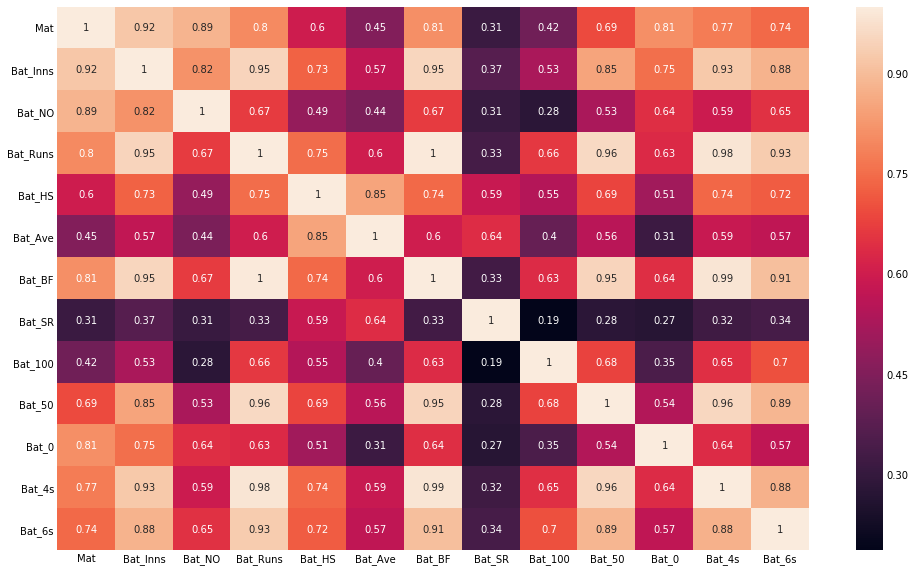

In [13]:
plt.figure(figsize=(15,10))
cols = ['Mat', 'Bat_Inns', 'Bat_NO', 'Bat_Runs', 'Bat_HS','Bat_Ave', 'Bat_BF', 'Bat_SR', 'Bat_100', 'Bat_50', 'Bat_0', 'Bat_4s','Bat_6s',]
sns.heatmap((df[cols]).corr(),annot=True)

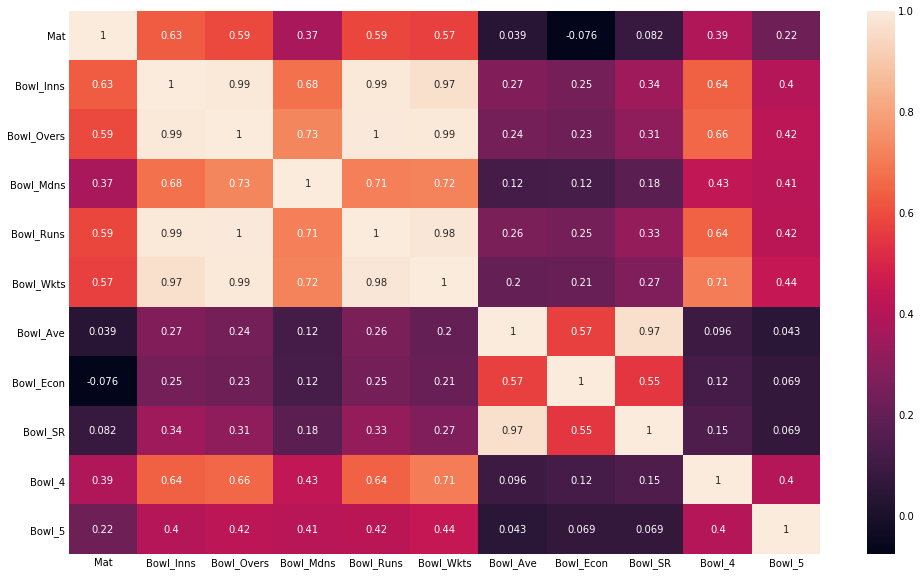

In [14]:
plt.figure(figsize=(15,10))
cols = ['Mat','Bowl_Inns', 'Bowl_Overs', 'Bowl_Mdns', 'Bowl_Runs','Bowl_Wkts', 'Bowl_Ave', 'Bowl_Econ', 'Bowl_SR', 'Bowl_4', 'Bowl_5']
sns.heatmap((df[cols]).corr(),annot=True)

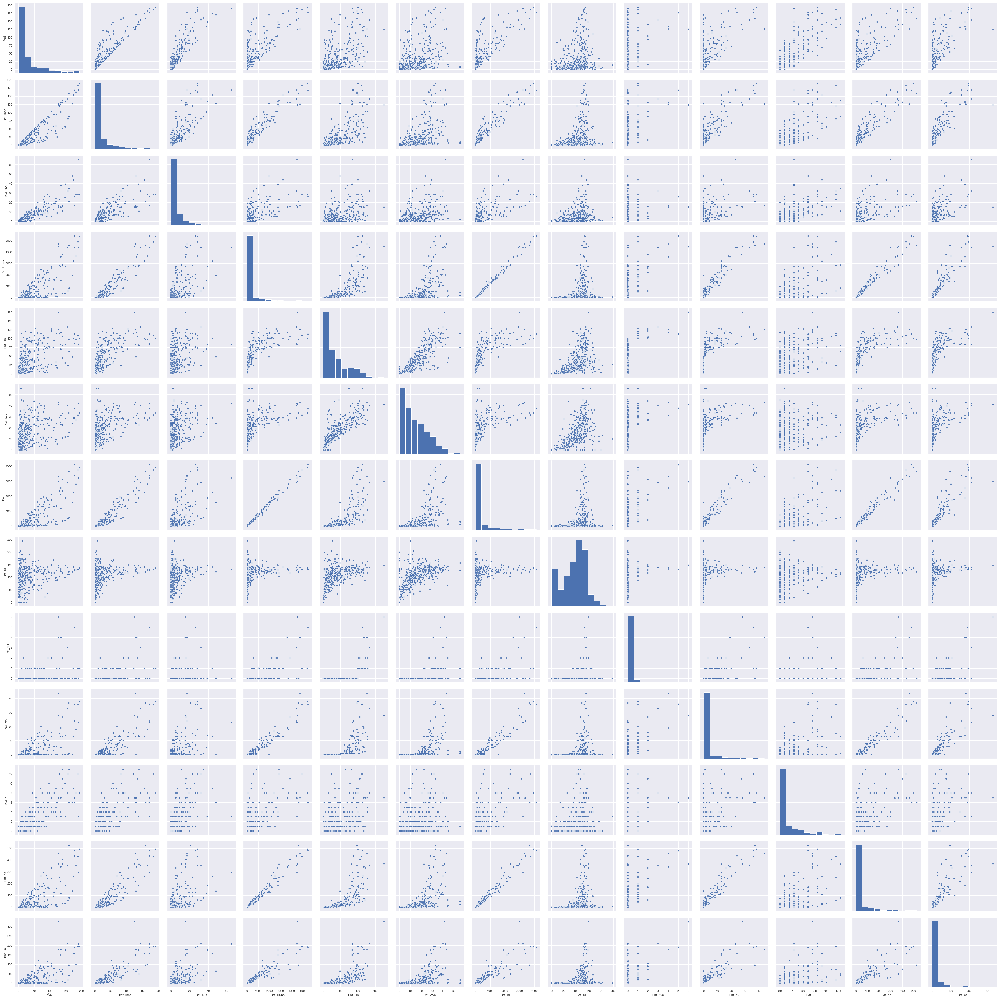

In [15]:
sns.set()
cols = ['Mat', 'Bat_Inns', 'Bat_NO', 'Bat_Runs', 'Bat_HS','Bat_Ave', 'Bat_BF', 'Bat_SR', 'Bat_100', 'Bat_50', 'Bat_0', 'Bat_4s','Bat_6s',]
sns.pairplot(df[cols], height = 4)
plt.show();

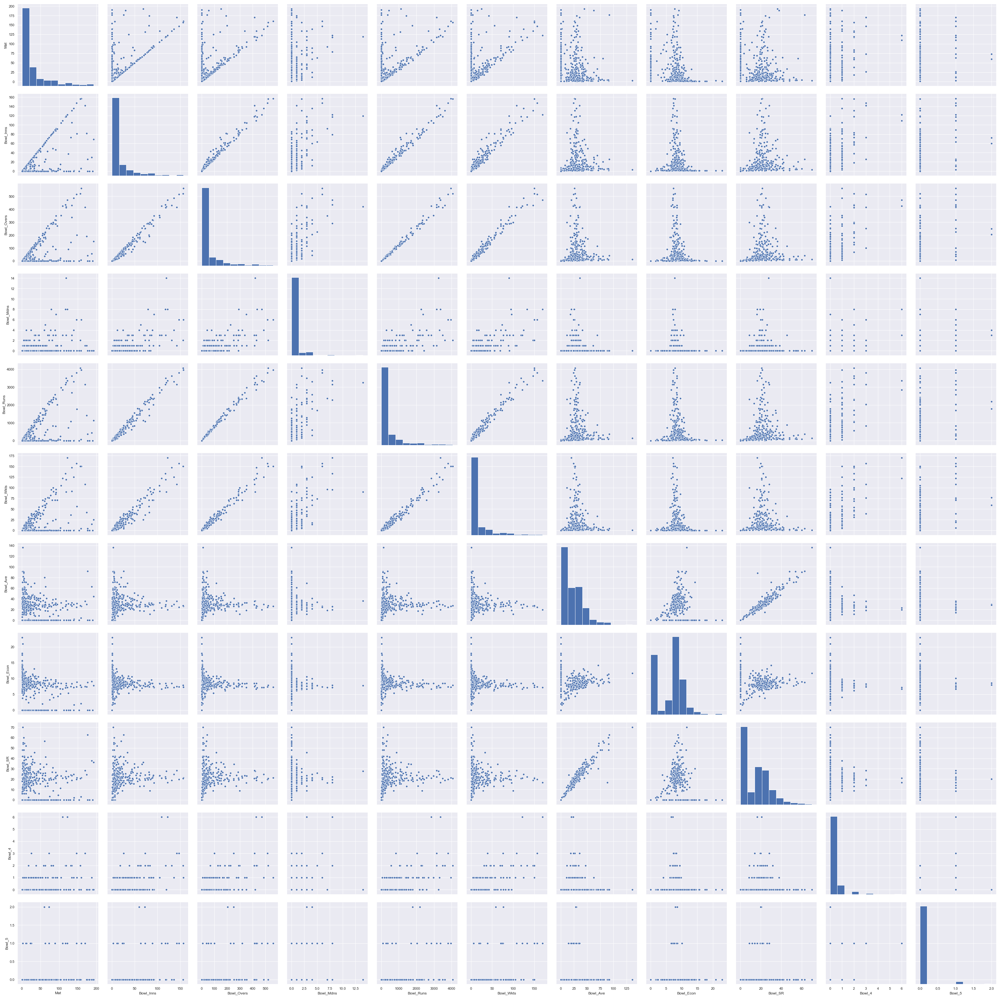

In [16]:
sns.set()
cols = ['Mat','Bowl_Inns', 'Bowl_Overs', 'Bowl_Mdns', 'Bowl_Runs','Bowl_Wkts', 'Bowl_Ave', 'Bowl_Econ', 'Bowl_SR', 'Bowl_4', 'Bowl_5']
sns.pairplot(df[cols], height = 4)
plt.show();

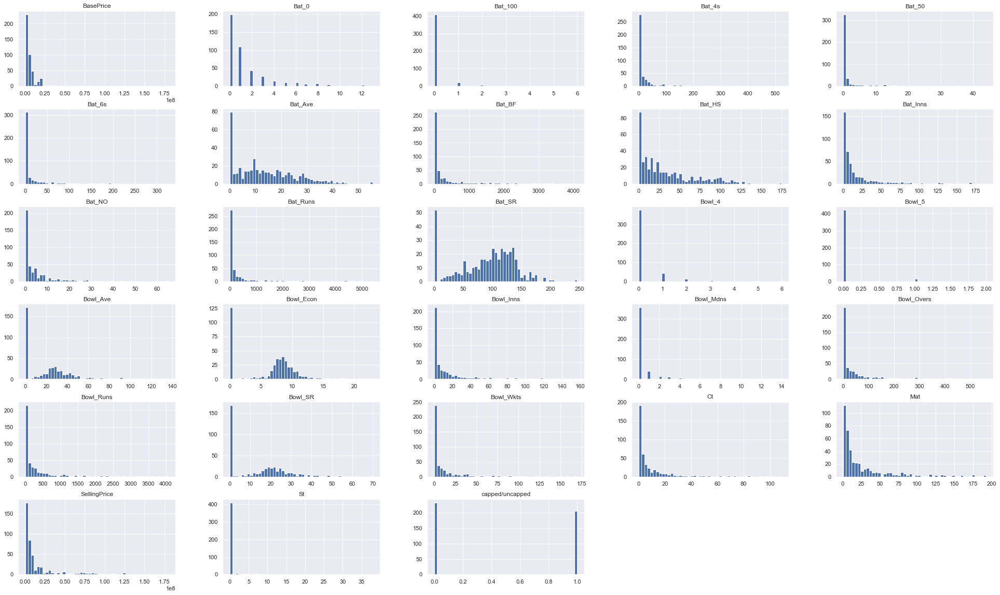

In [17]:
df.hist(bins=50, figsize=(30,20));

In [18]:
df.Type.value_counts()

Bat            208
Bowl           181
Wk              29
All Rounder     20
Name: Type, dtype: int64

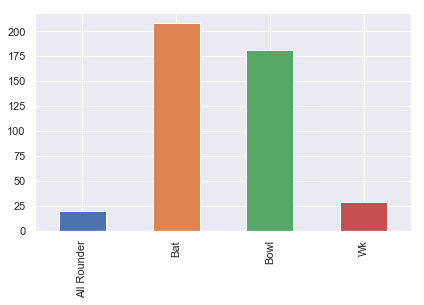

In [64]:
df['Type'].value_counts().sort_index().plot.bar()

In [20]:
pd.crosstab(df['capped/uncapped'], df.Type)

Type,All Rounder,Bat,Bowl,Wk
capped/uncapped,,,,
0,2,116,97,17
1,18,92,84,12


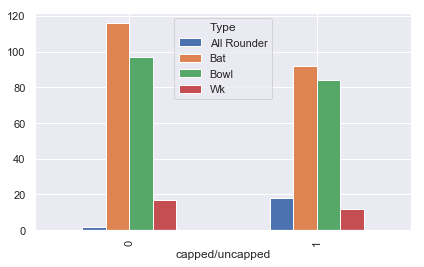

In [70]:
pd.crosstab(df['capped/uncapped'], df.Type).plot.bar()

In [66]:
df.columns

Index(['Player', 'Mat', 'Bat_Inns', 'Bat_NO', 'Bat_Runs', 'Bat_HS', 'Bat_Ave',
       'Bat_BF', 'Bat_SR', 'Bat_100', 'Bat_50', 'Bat_0', 'Bat_4s', 'Bat_6s',
       'Bowl_Inns', 'Bowl_Overs', 'Bowl_Mdns', 'Bowl_Runs', 'Bowl_Wkts',
       'Bowl_Ave', 'Bowl_Econ', 'Bowl_SR', 'Bowl_4', 'Bowl_5', 'Ct', 'St',
       'capped/uncapped', 'Type', 'BasePrice', 'SellingPrice'],
      dtype='object')

[]

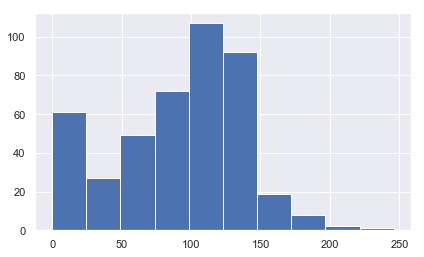

In [22]:
df.Bat_SR.hist()
plt.plot()

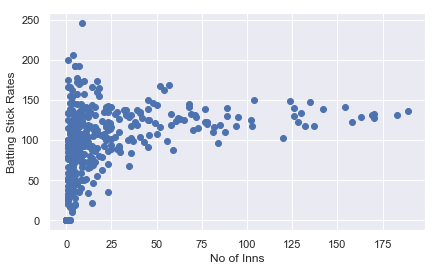

In [23]:
plt.scatter(df.Bat_Inns , df.Bat_SR)
plt.xlabel("No of Inns")
plt.ylabel("Batting Stick Rates")
plt.show()

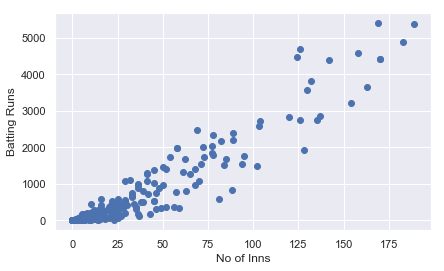

In [24]:
plt.scatter(df.Bat_Inns , df.Bat_Runs)
plt.xlabel("No of Inns")
plt.ylabel("Batting Runs")
plt.show()

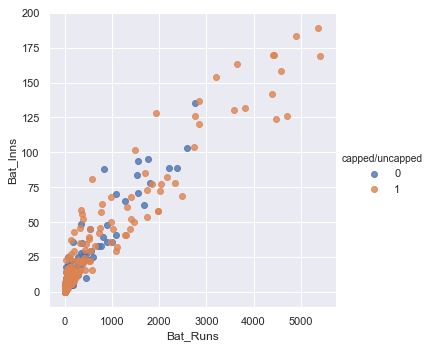

In [25]:
sns.lmplot(x='Bat_Runs',y="Bat_Inns",data=df,hue='capped/uncapped',fit_reg=False)
plt.show()

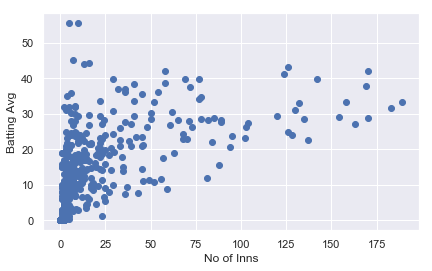

In [26]:
plt.scatter(df.Bat_Inns , df.Bat_Ave)
plt.xlabel("No of Inns")
plt.ylabel("Batting Avg")
plt.show()

[]

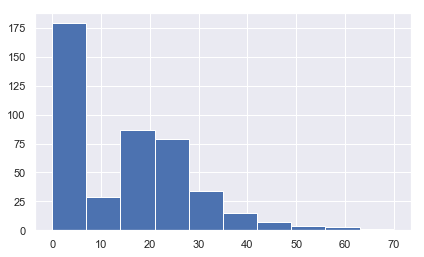

In [27]:
df.Bowl_SR.hist()
plt.plot()

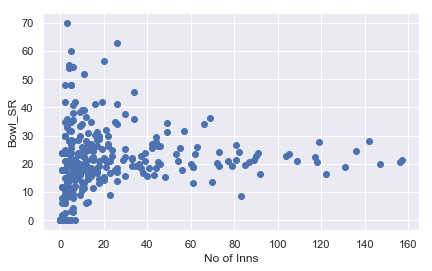

In [28]:
plt.scatter(df.Bowl_Inns , df.Bowl_SR)
plt.xlabel("No of Inns")
plt.ylabel("Bowl_SR")
plt.show()

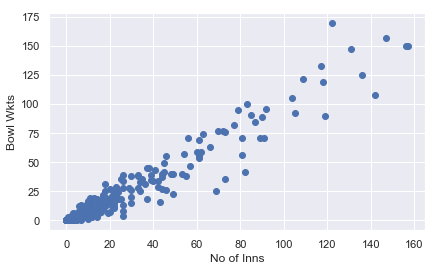

In [29]:
plt.scatter(df.Bowl_Inns , df.Bowl_Wkts)
plt.xlabel("No of Inns")
plt.ylabel("Bowl Wkts")
plt.show()

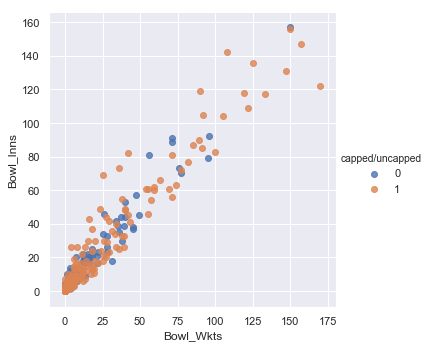

In [30]:
sns.lmplot(x='Bowl_Wkts',y="Bowl_Inns",data=df,hue='capped/uncapped',fit_reg=False)
plt.show()

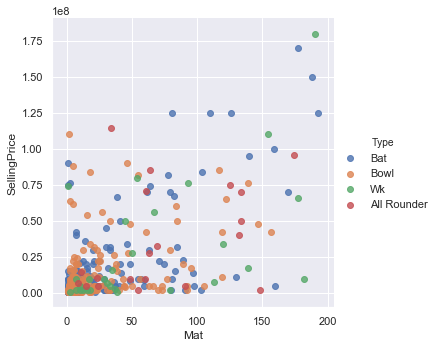

In [31]:
sns.lmplot(x='Mat',y="SellingPrice",data=df,hue='Type',fit_reg=False)
plt.show()

In [32]:
df.columns

Index(['Player', 'Mat', 'Bat_Inns', 'Bat_NO', 'Bat_Runs', 'Bat_HS', 'Bat_Ave',
       'Bat_BF', 'Bat_SR', 'Bat_100', 'Bat_50', 'Bat_0', 'Bat_4s', 'Bat_6s',
       'Bowl_Inns', 'Bowl_Overs', 'Bowl_Mdns', 'Bowl_Runs', 'Bowl_Wkts',
       'Bowl_Ave', 'Bowl_Econ', 'Bowl_SR', 'Bowl_4', 'Bowl_5', 'Ct', 'St',
       'capped/uncapped', 'Type', 'BasePrice', 'SellingPrice'],
      dtype='object')

# Batting Statistics

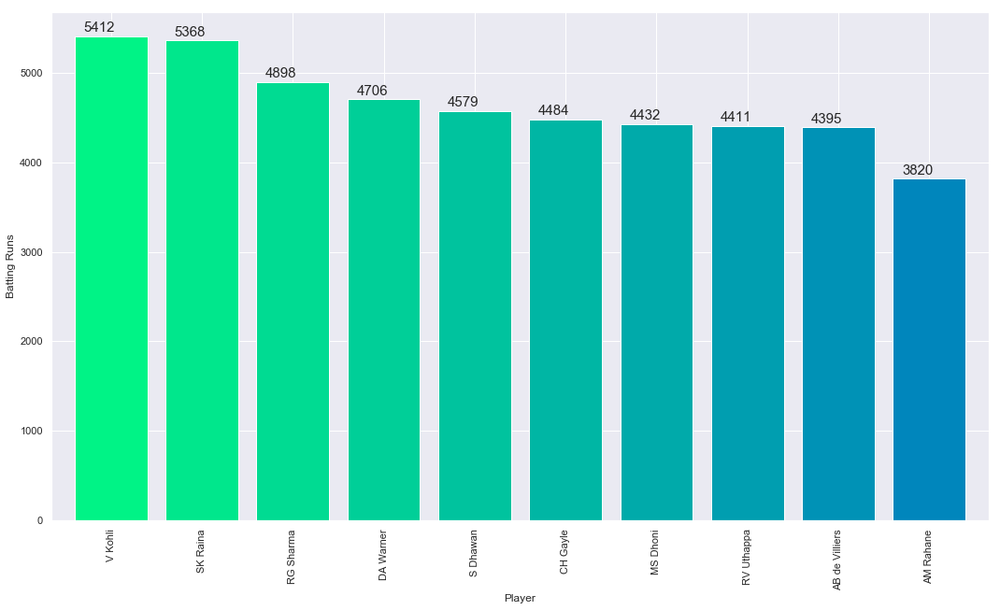

In [33]:
mlt.subplots(figsize=(16,10))
max_runs=df.groupby(['Player'])['Bat_Runs'].sum()
ax=max_runs.sort_values(ascending=False)[:10].plot.bar(width=0.8,color=sns.color_palette('winter_r',20))
ax.set(xlabel='Player', ylabel='Batting Runs')
for p in ax.patches:
    ax.annotate(format(p.get_height()), (p.get_x()+0.1, p.get_height()+50),fontsize=15)
mlt.show()

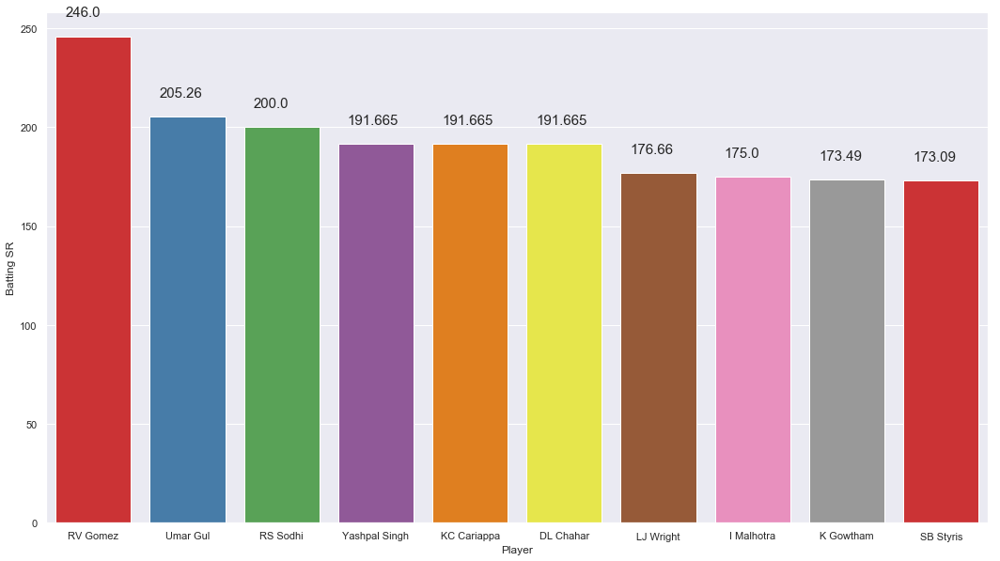

In [34]:
plt.figure(figsize=(16,10))
TopBatting=df.sort_values(by=['Bat_SR'],ascending=False).head(10)
ax=sns.barplot(x='Player',y='Bat_SR', data=TopBatting, palette = 'Set1')
ax.set(xlabel='Player', ylabel='Batting SR')
for p in ax.patches:
    ax.annotate(format(p.get_height()), (p.get_x()+0.1, p.get_height()+10),fontsize=15)

<Figure size 1152x720 with 0 Axes>

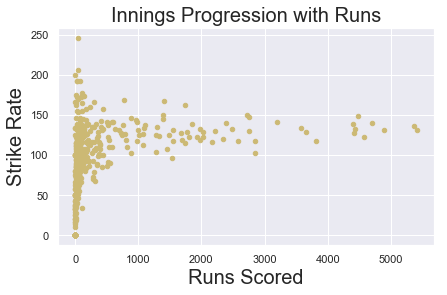

In [35]:
plt.figure(figsize=(16,10))
ax = df.plot(kind = 'scatter',x = 'Bat_Runs', y = 'Bat_SR',color = 'y')
plt.xlabel('Runs Scored',fontsize = 20)
plt.ylabel('Strike Rate',fontsize = 20)
plt.title('Innings Progression with Runs',fontsize = 20)
plt.show()

In [36]:
average_score=df.sort_values(by='Bat_Ave',ascending=False)
average_score=average_score[average_score['Mat']>50].head(10)

strike_rate=df.sort_values(by='Bat_SR',ascending=False)
strike_rate=strike_rate[strike_rate['Mat']>50].head(10)

In [37]:
trace1 = go.Bar(x=average_score['Player'],y=average_score['Bat_Ave'],
                name='Average Score',marker=dict(color='gold'),opacity=0.6,showlegend=False)

trace2 = go.Bar(x=strike_rate['Player'],y=strike_rate['Bat_SR'],
                name='Strike Rate',marker=dict(color='brown'),opacity=0.6,showlegend=False)

fig = tools.make_subplots(rows=1, cols=2, subplot_titles=('Highest Average Score','Highest Strike Rate'))

fig.append_trace(trace1, 1, 1)
fig.append_trace(trace2, 1, 2)

fig['layout']['xaxis1'].update(title='Player')
fig['layout']['xaxis2'].update(title='Player')

iplot(fig)

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



In [38]:
data=[{"y": df.Bat_Inns,
        "x": df.Player,
        "mode":"markers",
        "marker":{"color":df.Bat_6s,"size" :df.Bat_Ave,'showscale': True},
        "text": df.Player }]

iplot(data)


In [39]:
top_6 = df.sort_values('Bat_6s',ascending=False).head(10)
top_4 = df.sort_values('Bat_4s',ascending=False).head(10)
top_100 = df.sort_values('Bat_100',ascending=False).head(10)
top_50 = df.sort_values('Bat_50',ascending=False).head(10)

In [40]:
trace1 = go.Scatter(x=top_6.Player,y =top_6['Bat_6s'],name='6"s',marker =dict(color= "blue",size = 9),line=dict(width=2,dash='dash'))
trace2 = go.Scatter(x=top_4.Player,y = top_4['Bat_4s'],name='4"s',marker =dict(color= "orange",size = 9),line=dict(width=2,dash='longdash'))
trace3 = go.Scatter(x=top_100.Player,y = top_100['Bat_100'],name='100"s',marker =dict(color= "green",size = 9),line=dict(width=2,dash='dashdot'))
trace4 = go.Scatter(x=top_50.Player,y = top_50['Bat_50'],name='50"s',marker =dict(color= "red",size = 9),line=dict(width=2,dash='longdashdot'))

fig = tools.make_subplots(rows=4, cols=1, subplot_titles=('Top 6"s Scorer','Top 4"s Scorer',
                                                          'Top 100"s Scorer','Top 50"s Scorer'))

fig.append_trace(trace1, 1, 1)
fig.append_trace(trace2, 2, 1)
fig.append_trace(trace3, 3, 1)
fig.append_trace(trace4, 4, 1)

fig['layout'].update(title='Top Scorer in each Category',showlegend=False)
iplot(fig)

This is the format of your plot grid:
[ (1,1) x1,y1 ]
[ (2,1) x2,y2 ]
[ (3,1) x3,y3 ]
[ (4,1) x4,y4 ]



In [75]:
top_scores = df.groupby(["Mat", "Player","Bat_HS"])["Bat_Runs"].sum().reset_index()
top_scores.sort_values('Bat_Runs', ascending=0).head(10)
top_scores.nlargest(10,'Bat_Runs')

,Mat,Player,Bat_HS,Bat_Runs
433,177,V Kohli,113,5412
437,193,SK Raina,100,5368
435,188,RG Sharma,109,4898
416,126,DA Warner,126,4706
428,159,S Dhawan,97,4579
415,125,CH Gayle,175,4484
436,190,MS Dhoni,84,4432
432,177,RV Uthappa,87,4411
426,154,AB de Villiers,133,4395
423,140,AM Rahane,105,3820


# Bolwing Statistics

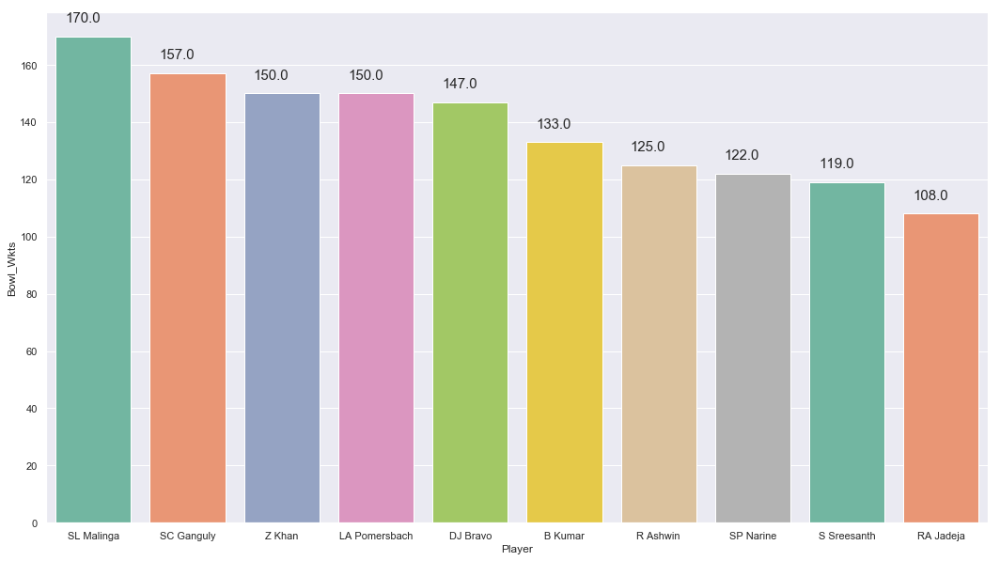

In [41]:
plt.figure(figsize=(16,10))
TopBolwing=df.sort_values(by=['Bowl_Wkts'],ascending=False).head(10)
ax=sns.barplot(x='Player',y='Bowl_Wkts', data=TopBolwing, palette = 'Set2')
ax.set(xlabel='Player', ylabel='Bowl_Wkts')
for p in ax.patches:
    ax.annotate(format(p.get_height()), (p.get_x()+0.1, p.get_height()+5),fontsize=15)

In [54]:
top_Wkt = df.sort_values('Bowl_Wkts',ascending=False).head(10)
top_Eco = df.sort_values('Bowl_Econ',ascending=False).head(10)
top_Mdns = df.sort_values('Bowl_Mdns',ascending=False).head(10)
top_Avg = df.sort_values('Bowl_Ave',ascending=False).head(10)

In [56]:
trace1 = go.Scatter(x=top_Wkt.Player,y =top_Wkt['Bowl_Wkts'],name='Wicket',marker =dict(color= "blue",size = 9),line=dict(width=2,dash='dash'))
trace2 = go.Scatter(x=top_Eco.Player,y = top_Eco['Bowl_Econ'],name='Economy',marker =dict(color= "orange",size = 9),line=dict(width=2,dash='longdash'))
trace3 = go.Scatter(x=top_Mdns.Player,y = top_Mdns['Bowl_Mdns'],name='Mdn',marker =dict(color= "red",size = 9),line=dict(width=2,dash='dashdot'))
trace4 = go.Scatter(x=top_Avg.Player,y = top_Avg['Bowl_Ave'],name='Average',marker =dict(color= "yellow",size = 9),line=dict(width=2,dash='longdashdot'))

fig = tools.make_subplots(rows=4, cols=1, subplot_titles=('Top Wicket','Top Eco',
                                                          'Top Bowl Mdns','Top Average'))

fig.append_trace(trace1, 1, 1)
fig.append_trace(trace2, 2, 1)
fig.append_trace(trace3, 3, 1)
fig.append_trace(trace4, 4, 1)

fig['layout'].update(title='Top Scorer in each Category',showlegend=False)
iplot(fig)

This is the format of your plot grid:
[ (1,1) x1,y1 ]
[ (2,1) x2,y2 ]
[ (3,1) x3,y3 ]
[ (4,1) x4,y4 ]



In [44]:
trace = go.Scatter(y = df['Bowl_Wkts'],x = df['Player'],mode='markers',
                   marker=dict(size= df['Bowl_Wkts'].values,
                               color = df['Bowl_Econ'].values,
                               colorscale='Viridis',
                               showscale=True,
                               colorbar = dict(title = 'Economy')),
                   text = df['Bowl_Overs'].values)

data = [(trace)]

layout= go.Layout(autosize= True,
                  title= 'Top 20 Wicket Taking Bowlers',
                  hovermode= 'closest',
                  xaxis=dict(showgrid=False,zeroline=False,
                             showline=False),
                  yaxis=dict(title= 'Wickets Taken',ticklen= 5,
                             gridwidth= 2,showgrid=False,
                             zeroline=False,showline=False),
                  showlegend= False)

fig = go.Figure(data=data, layout=layout)
iplot(fig)

# Fielding Statistics 

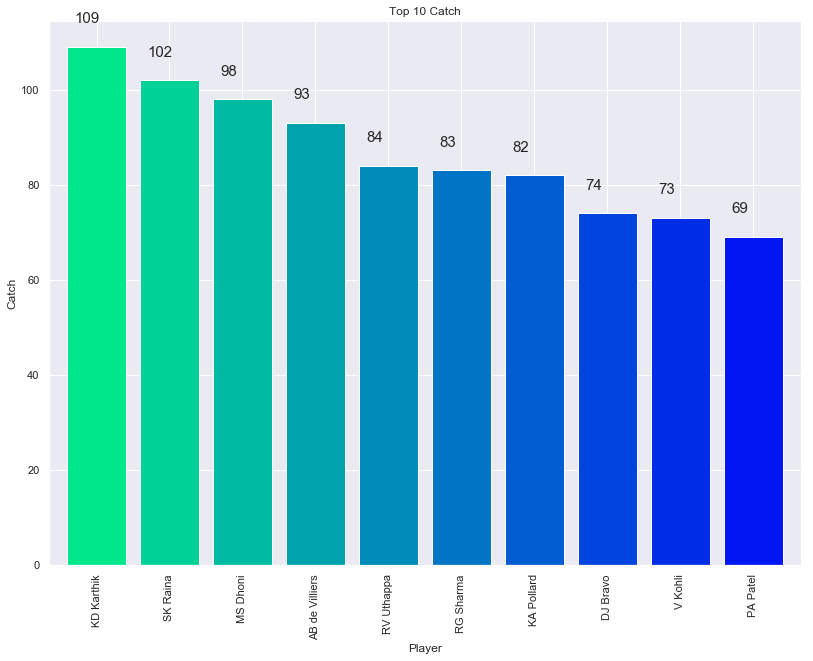

In [45]:
mlt.subplots(figsize=(12,10))
max_ct=df.groupby(['Player'])['Ct'].sum()
ax=max_ct.sort_values(ascending=False)[:10].plot.bar(width=0.8,color=sns.color_palette('winter_r',10))
ax.set(title= 'Top 10 Catch',xlabel='Player', ylabel='Catch')
for p in ax.patches:
    ax.annotate(format(p.get_height()), (p.get_x()+0.1, p.get_height()+5),fontsize=15)
mlt.show()

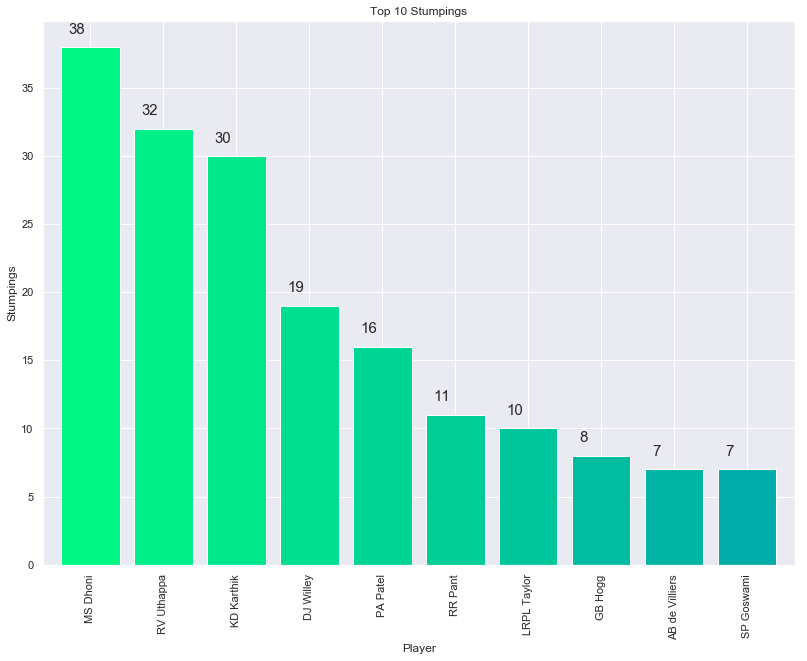

In [46]:
mlt.subplots(figsize=(12,10))
max_st=df.groupby(['Player'])['St'].sum()
ax=max_st.sort_values(ascending=False)[:10].plot.bar(width=0.8,color=sns.color_palette('winter_r',30))
ax.set(title= 'Top 10 Stumpings',xlabel='Player', ylabel='Stumpings')
for p in ax.patches:
    ax.annotate(format(p.get_height()), (p.get_x()+0.1, p.get_height()+1),fontsize=15)
mlt.show()

# Price Statistics

array([<matplotlib.axes._subplots.AxesSubplot object at 0x000001CAF3D4E9E8>],
      dtype=object)

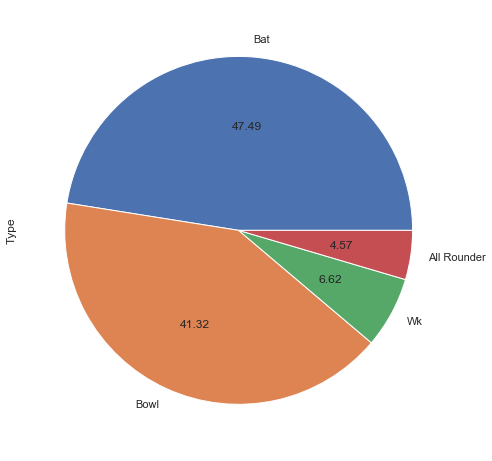

In [47]:
df['Type'].value_counts().plot.pie(subplots=True, figsize=(8, 8), autopct='%.2f')

array([<matplotlib.axes._subplots.AxesSubplot object at 0x000001CAF4507EB8>],
      dtype=object)

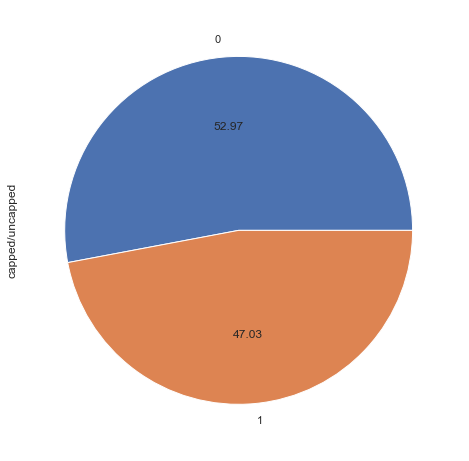

In [48]:
df['capped/uncapped'].value_counts().plot.pie(subplots=True, figsize=(8, 8), autopct='%.2f')

array([<matplotlib.axes._subplots.AxesSubplot object at 0x000001CAFA284390>],
      dtype=object)

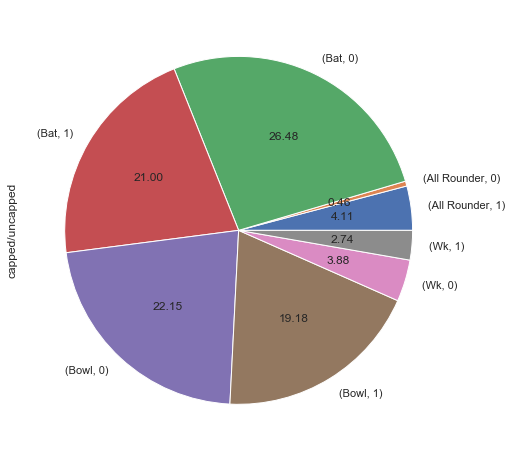

In [60]:
df.groupby(['Type'])['capped/uncapped'].value_counts().plot.pie(subplots=True, figsize=(8, 8), autopct='%.2f')

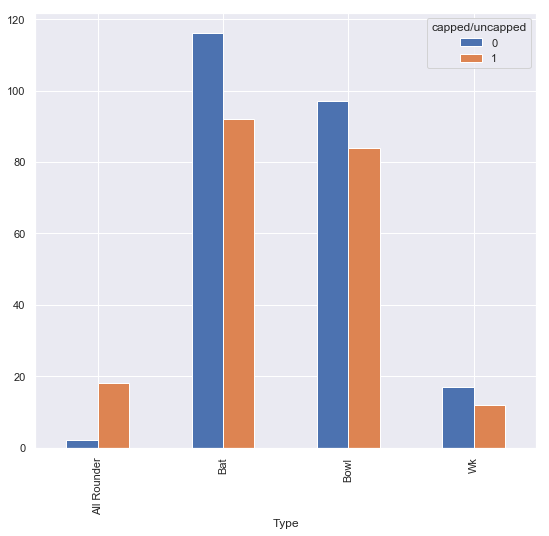

In [50]:
pd.crosstab(df['Type'],df['capped/uncapped']).plot.bar(figsize=(8, 8))

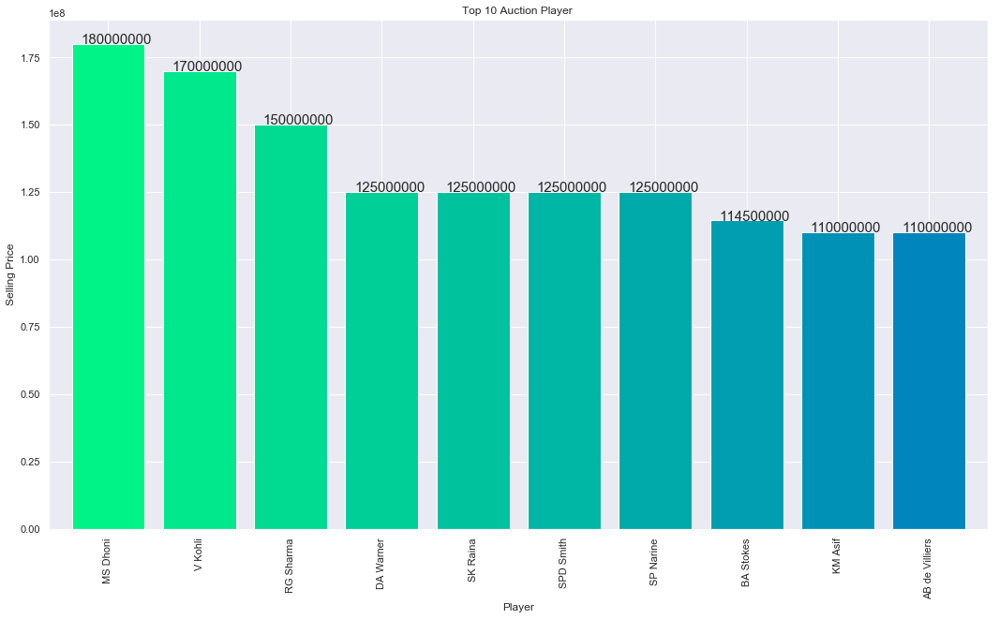

In [51]:
mlt.subplots(figsize=(16,10))
max_price=df.groupby(['Player'])['SellingPrice'].sum()
ax=max_price.sort_values(ascending=False)[:10].plot.bar(width=0.8,color=sns.color_palette('winter_r',20))
ax.set(title= 'Top 10 Auction Player ',xlabel='Player', ylabel='Selling Price')
for p in ax.patches:
    ax.annotate(format(p.get_height()), (p.get_x()+0.1, p.get_height()+50),fontsize=15)
mlt.show()

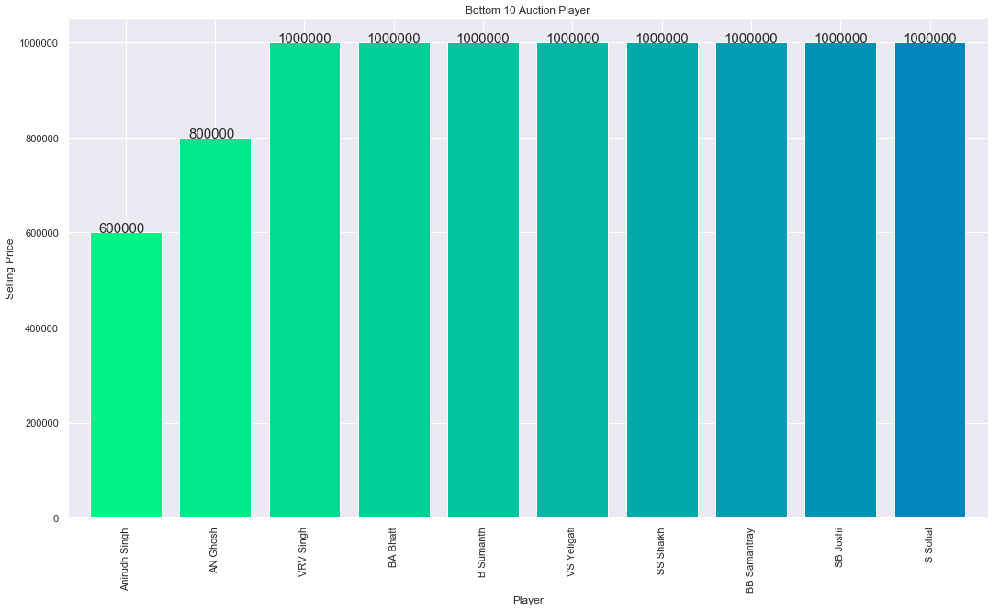

In [52]:
mlt.subplots(figsize=(16,10))
max_price=df.groupby(['Player'])['SellingPrice'].sum()
ax=max_price.sort_values(ascending=True)[:10].plot.bar(width=0.8,color=sns.color_palette('winter_r',20))
ax.set(title= 'Bottom 10 Auction Player',xlabel='Player', ylabel='Selling Price')
for p in ax.patches:
    ax.annotate(format(p.get_height()), (p.get_x()+0.1, p.get_height()+50),fontsize=15)
mlt.show()

In [77]:
top_Price = df.groupby(["Player","Type","capped/uncapped"])["SellingPrice"].sum().reset_index()
top_Price.sort_values('SellingPrice', ascending=0).head(10)
top_Price.nlargest(10,'SellingPrice')

,Player,Type,capped/uncapped,SellingPrice
240,MS Dhoni,Wk,1,180000000
415,V Kohli,Bat,1,170000000
301,RG Sharma,Bat,1,150000000
95,DA Warner,Bat,1,125000000
359,SK Raina,Bat,1,125000000
370,SP Narine,Bat,1,125000000
371,SPD Smith,Bat,1,125000000
63,BA Stokes,All Rounder,1,114500000
20,AB de Villiers,Wk,1,110000000
187,KM Asif,Bowl,1,110000000
